In [197]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

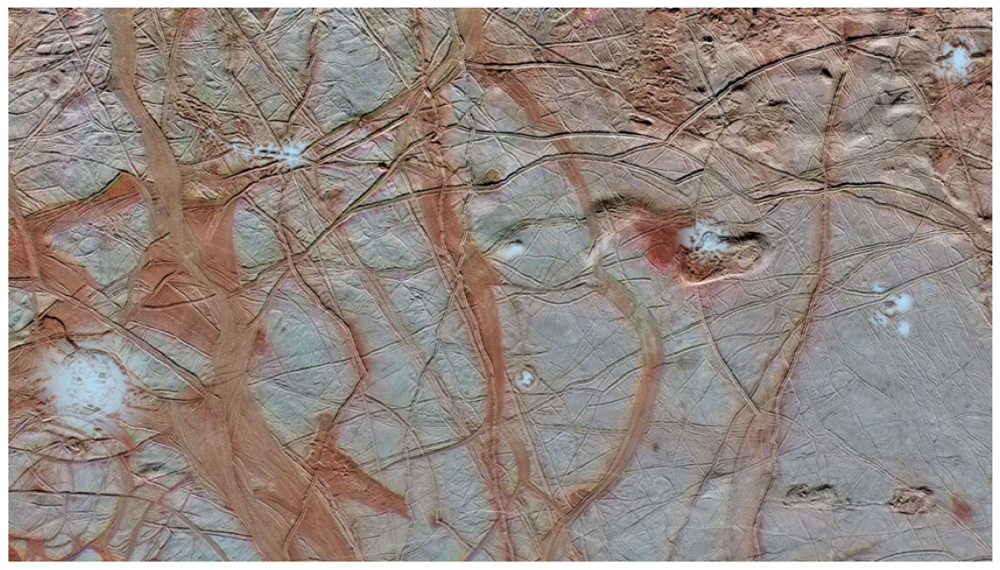

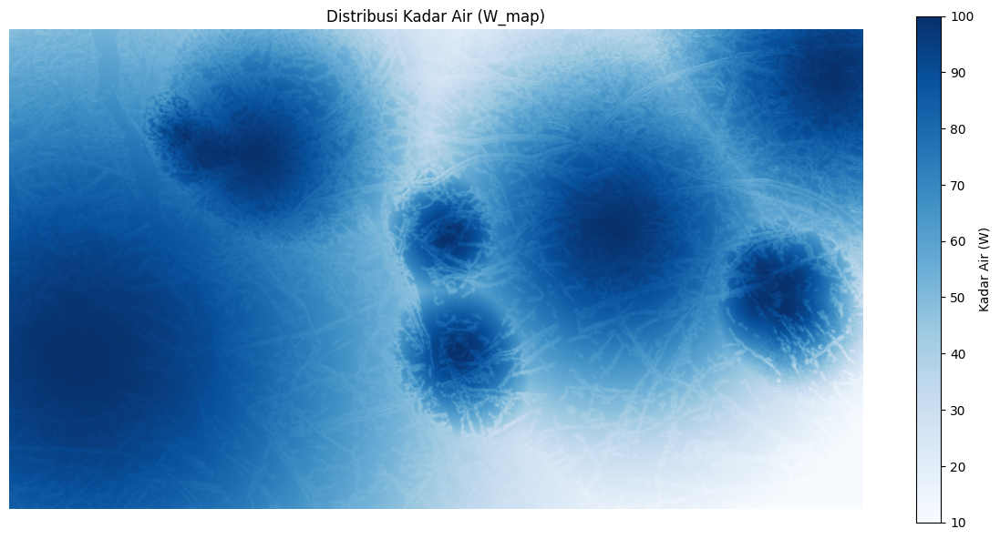

In [198]:
# Load image
img_path = r"europa_map\first map.jpg"
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
height, width, _ = img.shape

# Grayscale image
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Crack map (C_map) -> Celah es
edges = cv2.Canny(gray, 100, 200)
C_blurred = cv2.GaussianBlur(edges.astype(np.float32), (5, 5), 0)
C_map = np.clip(C_blurred / C_blurred.max(), 0, 1)

# Resistance map (R_map) -> Ridges
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=5)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=5)
R_gradient = np.sqrt(sobelx**2 + sobely**2)
R_map = R_gradient / R_gradient.max()

# Water sources
def pin_water(x, y, spread, R_factor):
    return (x, y, spread, R_factor)
def pin_water_pct(x_pct, y_pct, spread, R_factor):
    return (x_pct * width / 100, y_pct * height / 100, spread, R_factor)

waters = [
    pin_water_pct(71, 42, 180, 25),
    pin_water_pct(52.7, 67, 80, 30),
    pin_water_pct(8.4, 68, 350, 40),
    pin_water(530, 250, 70, 20),
    pin_water(911, 324, 70, 10),
    pin_water(935, 307, 70, 10),
    pin_water(936, 336, 70, 90),
    pin_water(909, 299, 70, 15),
    pin_water(298, 154, 150, 10),
    pin_water(211, 130, 70, 15),
    pin_water(285, 153, 100, 0),
    pin_water(273, 151, 75, 0),
    pin_water(261, 150, 90, 0),
    pin_water(249, 149, 90, 0),
    pin_water(237, 146, 90, 0),
    pin_water(993, 53, 180, 40),
    pin_water(919, 310, 80, 24)
]

# Spread water on the map
def pour_water(center, resist_map, crack_map, max_val=100, sigma=100, R_factor=30, C_factor=20):
    y_idx, x_idx = np.indices(resist_map.shape)
    distance = np.sqrt((x_idx - center[0])**2 + (y_idx - center[1])**2)
    effective_distance = distance + R_factor * resist_map + C_factor * crack_map

    decay = max_val * np.exp(-(effective_distance**2) / (2 * sigma**2))        # Gaussian decay
    # decay = max_val / (1 + (effective_distance / sigma)**2)                  # Inverse quadratic decay
    # decay = max_val * np.exp(-effective_distance / sigma)                    # Exponential decay
    # decay = max_val * np.maximum(0, (1 - effective_distance / (2 * sigma)))  # Cutoff decay (cone)
    # decay = np.clip(max_val - (effective_distance / sigma) * max_val, 30, 100)  # Linear decay (default)
    return decay

# Rebuild water map dengan baseline 10
W_map = np.full((height, width), 10.0)
for cx, cy, sprd, R_factor in waters:
    radial = pour_water((cx, cy), R_map, C_map, max_val=100, sigma=sprd, R_factor=R_factor)
    W_map = np.maximum(W_map, radial)

# Center radially sharp, soft edge
for cx, cy, sprd, *_ in waters:
    cx, cy = int(cx), int(cy)
    patch_radius = max(1, int(sprd // 10))
    y_idx, x_idx = np.ogrid[-patch_radius:patch_radius+1, -patch_radius:patch_radius+1]
    fade_sharp = patch_radius / 6
    mask = np.exp(-(x_idx**2 + y_idx**2) / (2 * fade_sharp**2))
    mask = 100 * (mask / mask.max())

    y1, y2 = max(0, cy - patch_radius), min(height, cy + patch_radius + 1)
    x1, x2 = max(0, cx - patch_radius), min(width, cx + patch_radius + 1)
    my1, my2 = patch_radius - (cy - y1), patch_radius + (y2 - cy)
    mx1, mx2 = patch_radius - (cx - x1), patch_radius + (x2 - cx)

    W_map[y1:y2, x1:x2] = np.maximum(W_map[y1:y2, x1:x2], mask[my1:my2, mx1:mx2])

# Only W > 98 have alpha > 0 (displayed)
W_alpha = np.clip((W_map - 98) / 2, 0, 1)

# Blending to map
water_color = np.array([182, 219, 242]) / 255
blended = img_rgb / 255.0
for c in range(3):
    blended[:, :, c] = (1 - W_alpha) * blended[:, :, c] + W_alpha * water_color[c]

# Visualize map
plt.figure(figsize=(12, 7))
plt.imshow(blended)
# plt.title("Water Map Blended with Terrain & Crack-Aware Distribution")
plt.axis('off')
plt.tight_layout()
plt.show()

# Visualize water distribution map
plt.figure(figsize=(12, 6))
plt.imshow(W_map, cmap="Blues")
plt.colorbar(label="Kadar Air (W)")
plt.title("Distribusi Kadar Air (W_map)")
plt.axis('off')
plt.tight_layout()
plt.show()



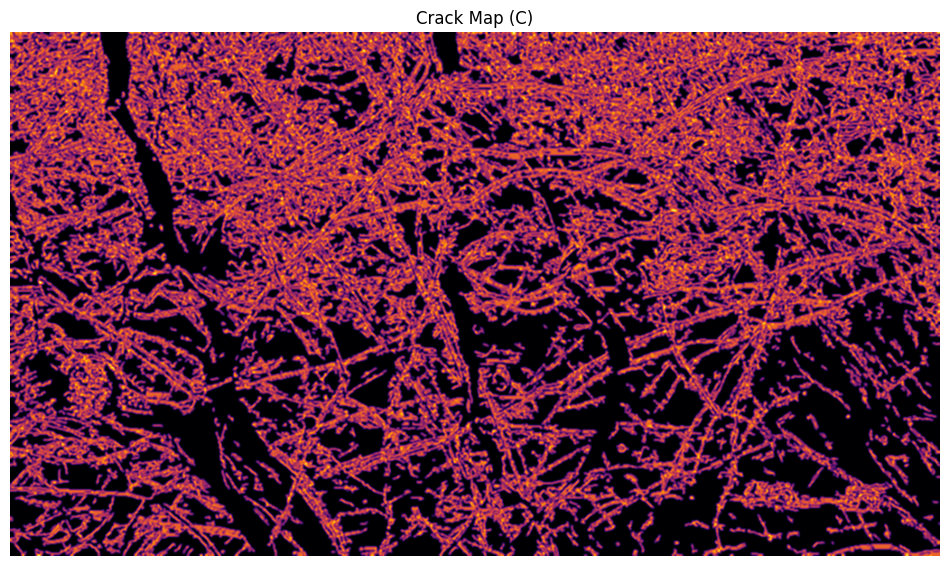

In [199]:
# Extract Ice Cracks

# Crack Detection (Canny for cracks/celestial fissures)
edges = cv2.Canny(gray, threshold1=100, threshold2=200)

# Convert to crack severity (C_map)
blurred = cv2.GaussianBlur(edges.astype(np.float32), (5, 5), 0)
C_map = blurred / blurred.max()  # normalize to 0–1
C_map = np.clip(C_map, 0, 1)

# Plot
plt.figure(figsize=(12, 7))
plt.imshow(C_map, cmap='inferno')
plt.title("Crack Map (C)")
plt.axis('off')
plt.show()


<function matplotlib.pyplot.show(close=None, block=None)>

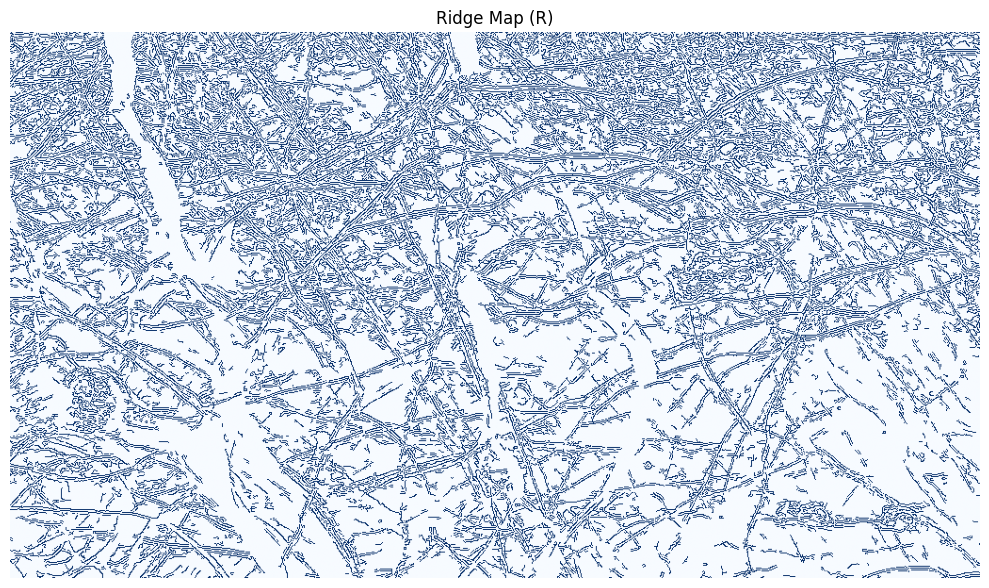

In [200]:
# Extract Ridges

resist_map = (R_map > 0.4).astype(np.uint8)
laplacian = cv2.Laplacian(gray, cv2.CV_64F)
resist_map = (np.abs(laplacian) > 45).astype(np.uint8)

edges = cv2.Canny(gray, 100, 200)
resist_map = (edges > 0).astype(np.uint8)
plt.figure(figsize=(10, 7))
plt.imshow(resist_map, cmap='Blues')
plt.title("Ridge Map (R)")
plt.axis('off')
plt.tight_layout()
plt.show

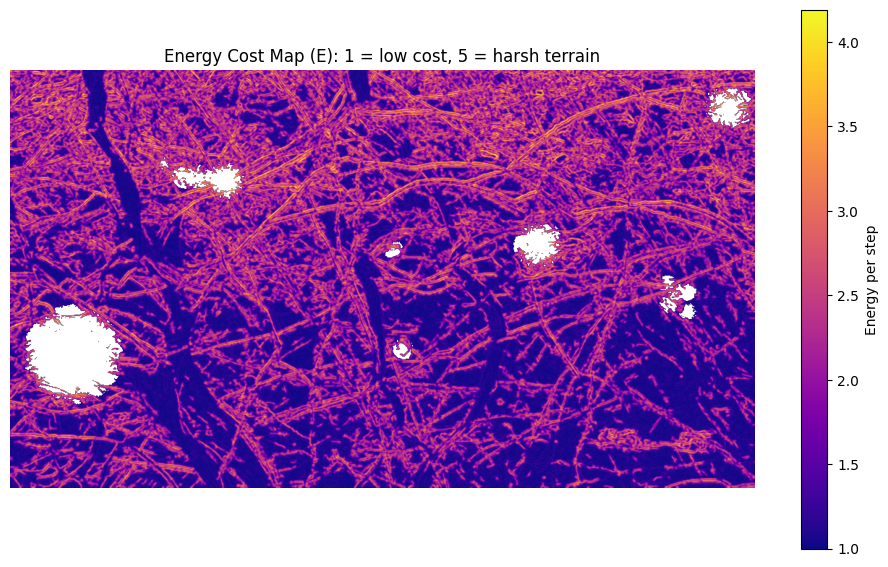

In [201]:
# Energy Consumption Map

# Compute E_map
E_map = 1 + 2 * R_map + 2 * C_map
E_map[W_map > 98] = np.nan  # block water areas
E_map = np.clip(E_map, 1, 5)

# Visualize E_map
plt.figure(figsize=(12, 7))
plt.imshow(E_map, cmap='plasma')
plt.title("Energy Cost Map (E): 1 = low cost, 5 = harsh terrain")
plt.colorbar(label='Energy per step')
plt.axis('off')
plt.show()


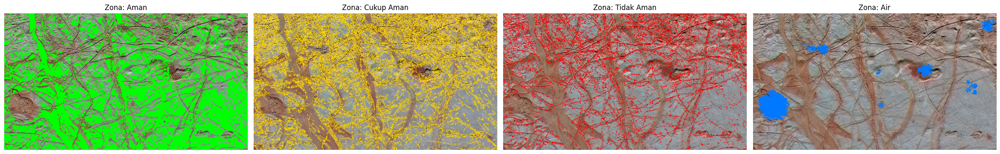

In [202]:
# Zone Map (Z)

Z_map = np.full((height, width), -1, dtype=int)

# Zona Air (kode: 3)
Z_map[W_map > 98] = 3

# Aman (kode: 0)
mask_aman = np.logical_and.reduce((
    W_map <= 98,
    R_map <= 0.35,
    C_map <= 0.3
))
Z_map[mask_aman] = 0

# Tidak Aman (kode: 2)
mask_bahaya = np.logical_and.reduce((
    W_map <= 98,
    np.logical_or(R_map > 0.6, C_map > 0.55)
))
Z_map[mask_bahaya] = 2

# Cukup Aman (kode: 1)
mask_cukup = np.logical_and.reduce((
    W_map <= 98,
    Z_map == -1  # semua yang belum terisi dan bukan zona air/bahaya
))
Z_map[mask_cukup] = 1

# Visualize Z_map
Z_labels = ['Aman', 'Cukup Aman', 'Tidak Aman', 'Air']
Z_colors = [
    [0, 255, 0],
    [255, 215, 0],
    [255, 0, 0],
    [0, 120, 255]
]

fig, axes = plt.subplots(1, 4, figsize=(24, 6))
for z in range(4):
    Z_overlay = img_rgb.copy()
    mask = (Z_map == z)
    for c in range(3):
        Z_overlay[:, :, c] = np.where(mask, Z_colors[z][c], img_rgb[:, :, c])
    axes[z].imshow(Z_overlay)
    axes[z].set_title(f"Zona: {Z_labels[z]}")
    axes[z].axis('off')

plt.tight_layout()
plt.show()


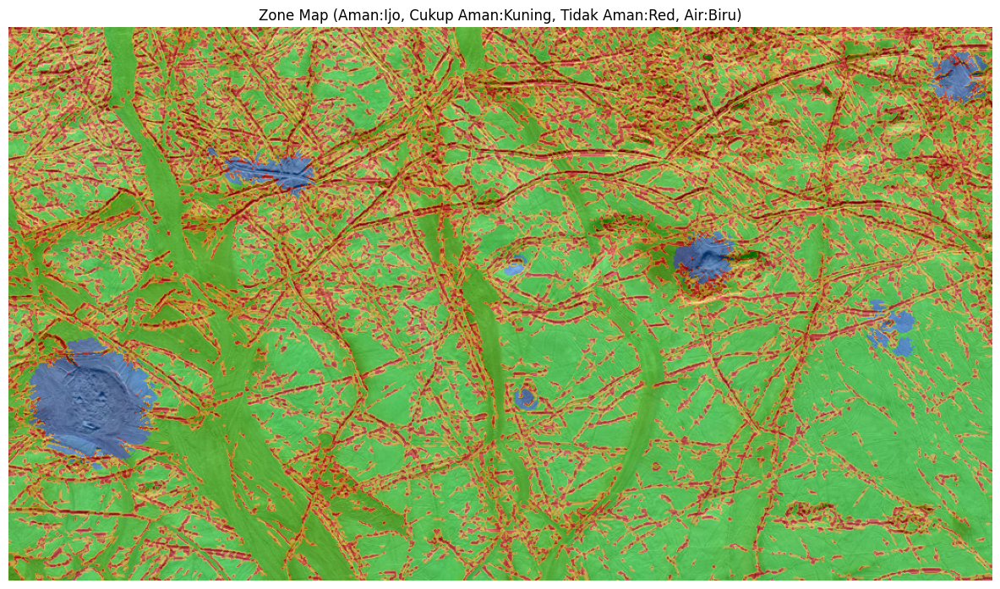

In [203]:


overlay_clr = {
    0: (0, 255, 0),      # Aman → Hijau
    1: (255, 215, 0),    # Cukup Aman → Kuning emas
    2: (255, 0, 0),      # Tidak Aman → Merah
    3: (0, 120, 255)     # Air → Biru terang
}

Z_mix = img_rgb.copy()
alpha = 0.4  # transparansi

# Terapkan overlay untuk setiap zona
for z, color in overlay_clr.items():
    mask = (Z_map == z)
    Z_layer = np.ones_like(img_rgb, dtype=np.uint8) * np.array(color, dtype=np.uint8)
    Z_mix[mask] = (
        alpha * Z_layer[mask] + (1 - alpha) * img_rgb[mask]
    ).astype(np.uint8)

# Tampilkan hasil gabungan
plt.figure(figsize=(12, 7))
plt.imshow(Z_mix)
plt.title("Zone Map (Aman:Ijo, Cukup Aman:Kuning, Tidak Aman:Red, Air:Biru)")
plt.axis('off')
plt.tight_layout()
plt.show()
